# Setup

pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

[![PyPI - Version](https://img.shields.io/pypi/v/ultralytics?logo=pypi&logoColor=white)](https://pypi.org/project/ultralytics/) [![Downloads](https://static.pepy.tech/badge/ultralytics)](https://clickpy.clickhouse.com/dashboard/ultralytics) [![PyPI - Python Version](https://img.shields.io/pypi/pyversions/ultralytics?logo=python&logoColor=gold)](https://pypi.org/project/ultralytics/)

In [1]:
!uv pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.3/112.6 GB disk)


<h1> Download dataset </h1>
<h3> Driver-Drowsiness dataset </h3>
<link> https://app.roboflow.com/rawans-workspace-ktqx2/driver-drowsiness-6irah-8m5gh/1/export </link>


In [ ]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Weights & Biases']

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir .
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

✅ Updated 'tensorboard=True'
JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true,
  "openvino_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


<IPython.core.display.Javascript object>

In [ ]:
# # download dataset from roboflow
# !pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="zlt2fBb9LtooqmQXyeky")
# project = rf.workspace("utarlddv1").project("nthuddd")
# version = project.version(1)
# dataset = version.download("yolov11")

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="zlt2fBb9LtooqmQXyeky")
project = rf.workspace("emma123").project("driver-drowsiness-6irah")
version = project.version(15)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!ls -la "/content/Driver-drowsiness-15/"

total 305856
drwxr-xr-x 4 root root      4096 Nov 16 18:17 .
drwxr-xr-x 1 root root      4096 Nov 16 18:15 ..
-rw-r--r-- 1 root root       326 Nov 16 18:17 data.yaml
-rw-r--r-- 1 root root       151 Nov 16 18:13 README.dataset.txt
-rw-r--r-- 1 root root      1083 Nov 16 18:13 README.roboflow.txt
-rw-r--r-- 1 root root 313156728 Nov 16 18:13 roboflow.zip
drwxr-xr-x 4 root root      4096 Nov 16 18:13 test
drwxr-xr-x 3 root root      4096 Nov 16 18:13 train


In [ ]:
# Fix the YAML file with absolute paths
import os

yaml_content = f'''train: {os.path.join(os.getcwd(), 'Driver-drowsiness-15/train/images')}
val: {os.path.join(os.getcwd(), 'Driver-drowsiness-15/test/images')}
test: {os.path.join(os.getcwd(), 'Driver-drowsiness-15/test/images')}

nc: 5
names: ['Eyes_closed', 'Eyes_open', 'Normal_face', 'Talking', 'Yawning']
'''

with open('/content/Driver-drowsiness-15/data.yaml', 'w') as f:
    f.write(yaml_content)

print("Fixed data.yaml! Now try training again.")

Fixed data.yaml! Now try training again.


In [ ]:
# Quick check and fix
import zipfile
import os

# 1. Extract the ZIP if not done
if not os.path.exists('/content/Driver-drowsiness-15/train/labels'):
    print("Extracting ZIP file...")
    with zipfile.ZipFile('/content/Driver-drowsiness-15/roboflow.zip', 'r') as zip_ref:
        zip_ref.extractall('/content/Driver-drowsiness-15/')

# 2. Verify structure
print("After extraction:")
for split in ['train', 'test']:
    images_dir = os.path.join('/content/Driver-drowsiness-15', split, 'images')
    labels_dir = os.path.join('/content/Driver-drowsiness-15', split, 'labels')

    if os.path.exists(images_dir):
        print(f"{split}: {len(os.listdir(images_dir))} images")
    else:
        print(f"{split}: images folder missing!")

    if os.path.exists(labels_dir):
        print(f"{split}: {len(os.listdir(labels_dir))} labels")
    else:
        print(f"{split}: labels folder missing!")

# 3. Check one label file content
labels_path = '/content/Driver-drowsiness-15/train/labels'
if os.path.exists(labels_path) and os.listdir(labels_path):
    sample_label = os.listdir(labels_path)[0]
    with open(os.path.join(labels_path, sample_label), 'r') as f:
        print(f"Sample label content: {f.read()}")

Extracting ZIP file...
After extraction:
train: 4863 images
train: 4863 labels
test: 1042 images
test: 1042 labels
Sample label content: 1 0.4421875 0.28671875 0.20546875 0.08046875
3 0.4453125 0.45 0.13359375 0.090625


In [ ]:
# Train YOLO11n on COCO8 for 3 epochs
!yolo train model=yolo11n.pt data=/content/Driver-drowsiness-15/data.yaml epochs=5 imgsz=640

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Driver-drowsiness-15/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=T

In [ ]:
# Check how many yawning examples you actually have
import os
labels_path = '/content/Driver-drowsiness-15/train/labels'
yawning_count = 0

for label_file in os.listdir(labels_path):
    with open(os.path.join(labels_path, label_file), 'r') as f:
        for line in f:
            if line.startswith('4'):  # Yawning is class 4
                yawning_count += 1

print(f"Yawning training examples: {yawning_count}")

Yawning training examples: 6


<h1> Train

In [ ]:
# !yolo train \
# model=/content/runs/detect/train3/weights/best.pt \  # ↑↑↑ YOUR EXISTING MODEL
# data=/content/Driver-drowsiness-15/data.yaml \
# epochs=100 \        # Much longer to learn rare classes
# imgsz=640 \
# batch=16 \
# patience=30 \       # Don't stop early - rare classes need time
# lr0=0.001 \         # Lower learning rate for fine-tuning
# cls=2.0 \           # Emphasize class imbalance
# augment=True \      # CRITICAL - create synthetic yawning examples
# fliplr=0.5 \        # Flip images
# mixup=0.2 \         # Blend images to create variations
# copy_paste=0.1 \    # Copy yawning mouths to other faces
# verbose=True        # See detailed progress


!yolo train model=/content/runs/detect/train3/weights/best.pt data=/content/Driver-drowsiness-15/data.yaml epochs=50 imgsz=640 batch=16 patience=20 lr0=0.001 cls=2.0 augment=True fliplr=0.5 mixup=0.2 copy_paste=0.1 verbose=True

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=2.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Driver-drowsiness-15/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=/content/runs/detect/train3/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pati

In [ ]:
!yolo export model=/content/runs/detect/train4/weights/best.pt format=torchscript

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/content/runs/detect/train4/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.2 MB)

TorchScript: starting export with torch 2.8.0+cu126...
TorchScript: export success ✅ 2.9s, saved as '/content/runs/detect/train4/weights/best.torchscript' (10.3 MB)

Export complete (3.3s)
Results saved to /content/runs/detect/train4/weights
Predict:         yolo predict task=detect model=/content/runs/detect/train4/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=/content/runs/detect/train4/weights/best.torchscript imgsz=640 data=/content/nthuddd-1/data.yaml  
Visualize:       https://netron.app
💡 L

<h1> Testing


image 1/1 /content/Driver-drowsiness-15/test/images/10-25-_png.rf.6fbe97bb76576b52bb99c2f22fdc4e89.jpg: 640x640 1 Eyes_open, 1 Talking, 10.8ms
Speed: 1.7ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


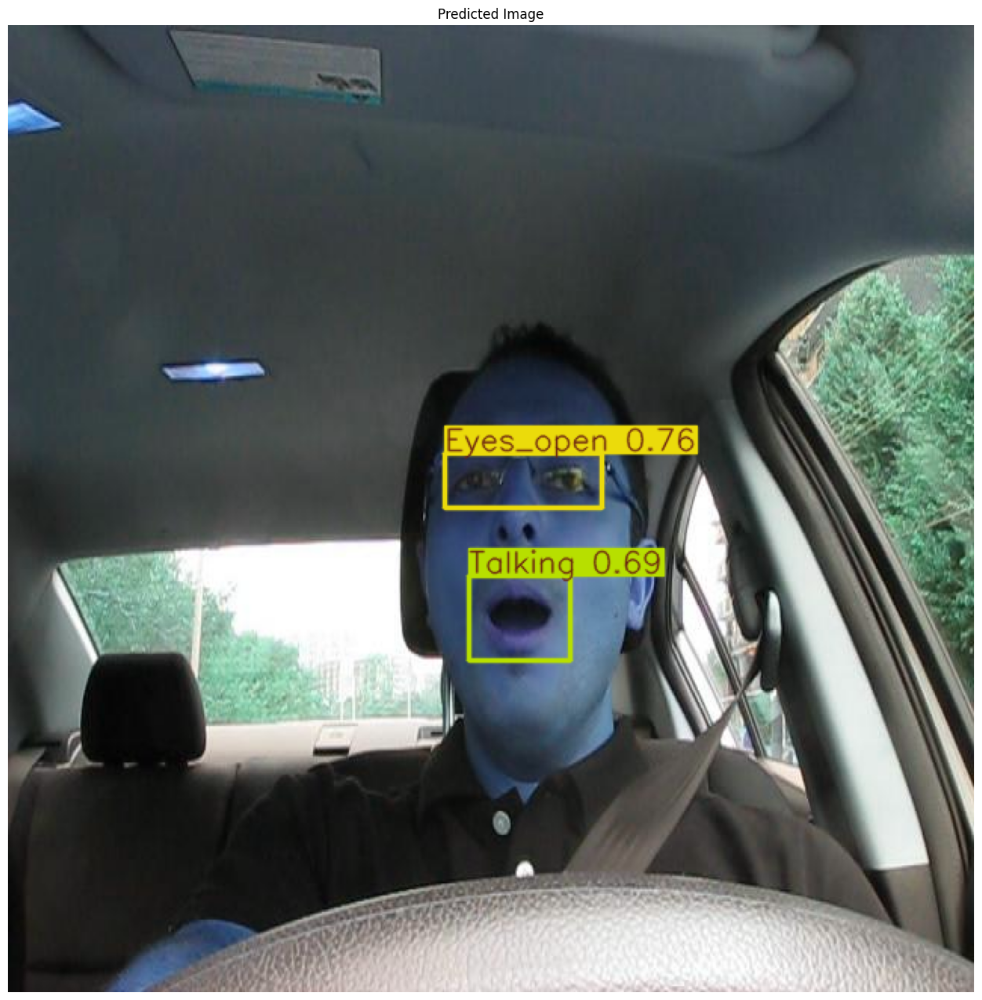

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/runs/detect/train4/weights/best.pt')  # load a pretrained model (recommended for training)

# Use the model
results = model('/content/Driver-drowsiness-15/test/images/10-25-_png.rf.6fbe97bb76576b52bb99c2f22fdc4e89.jpg')  # predict on an image


# Convert result to a NumPy array and display
predicted_image = results[0].plot()  # Convert prediction to an image

# visualize the image
import matplotlib.pyplot as plt
plt.figure(figsize=(16, 16))
plt.imshow(predicted_image)
plt.axis("off")
plt.title("Predicted Image")
plt.show()

In [ ]:
# from ultralytics import YOLO

# # Load a model
# model = YOLO('yolo11n.yaml')  # build a new model from scratch
# model = YOLO('yolo11n.pt')  # load a pretrained model (recommended for training)

# # Use the model
# results = model.train(data='coco8.yaml', epochs=3)  # train the model
# results = model.val()  # evaluate model performance on the validation set
# results = model('https://ultralytics.com/images/bus.jpg')  # predict on an image
# results = model.export(format='onnx')  # export the model to ONNX format

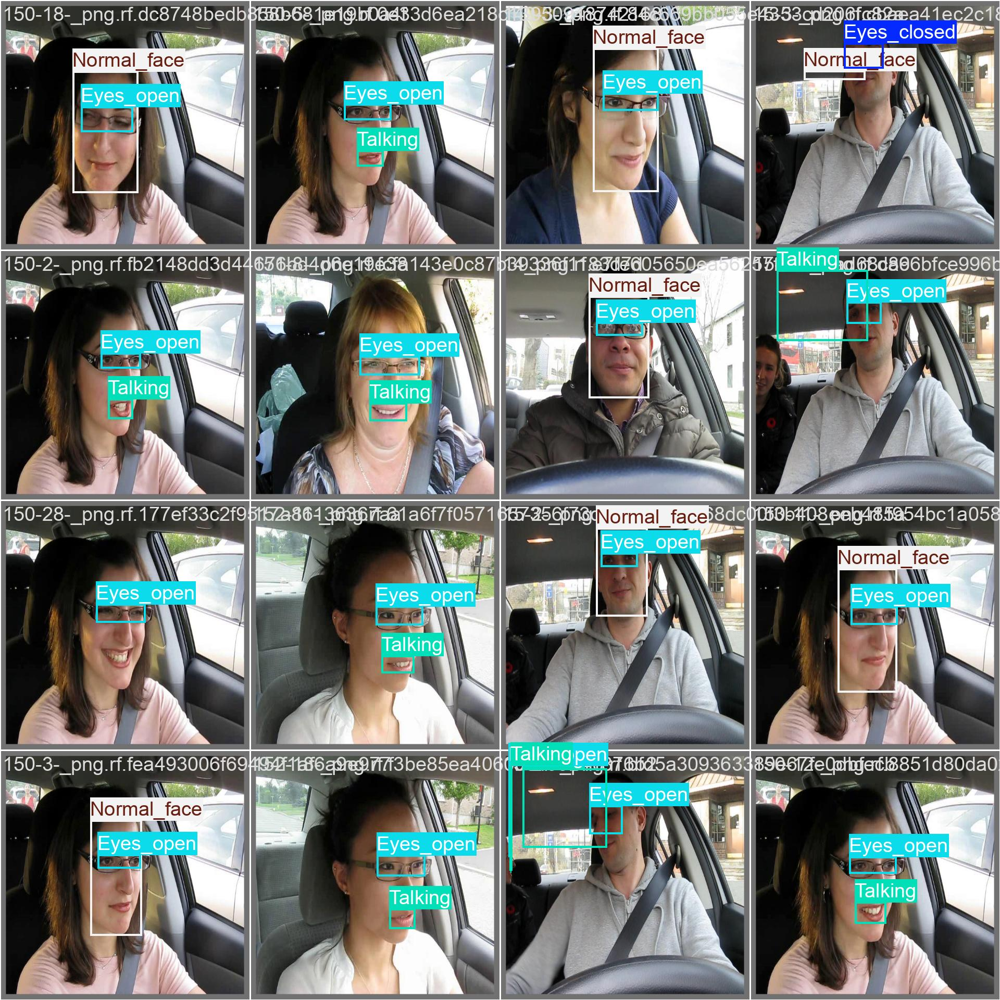

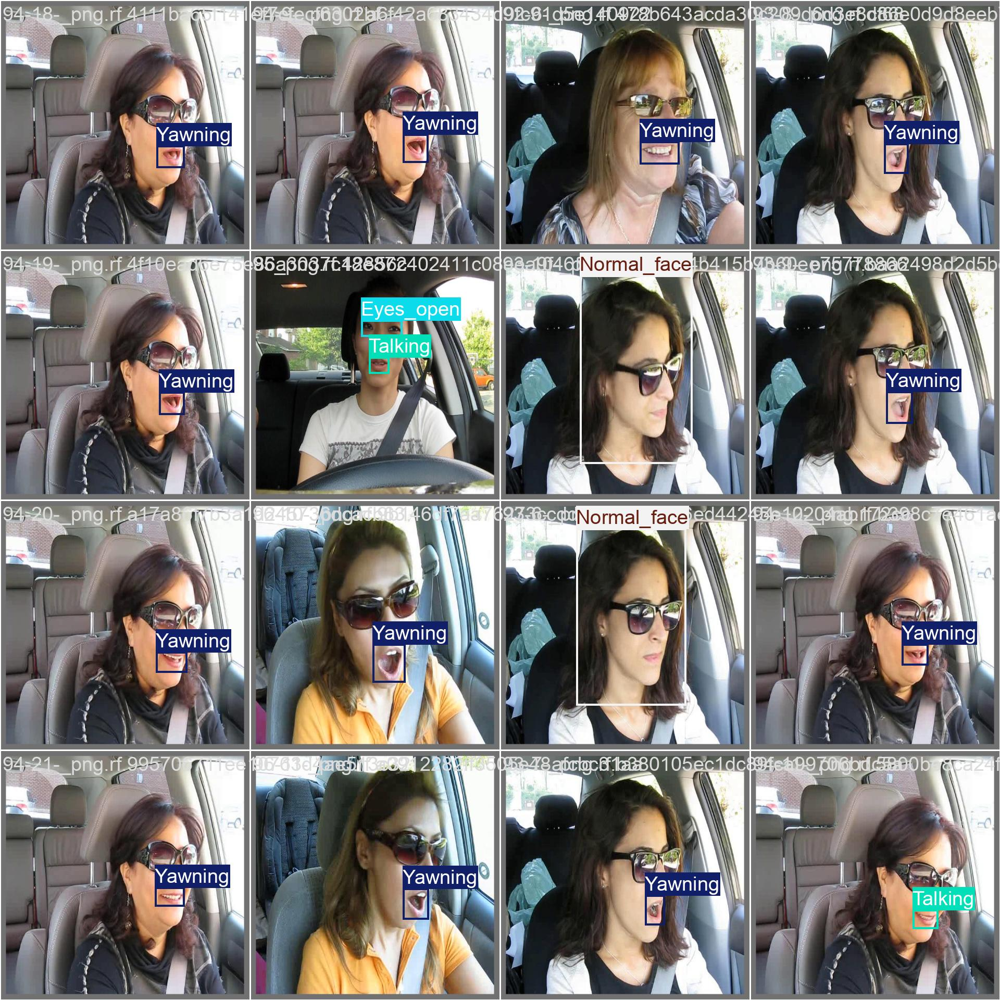

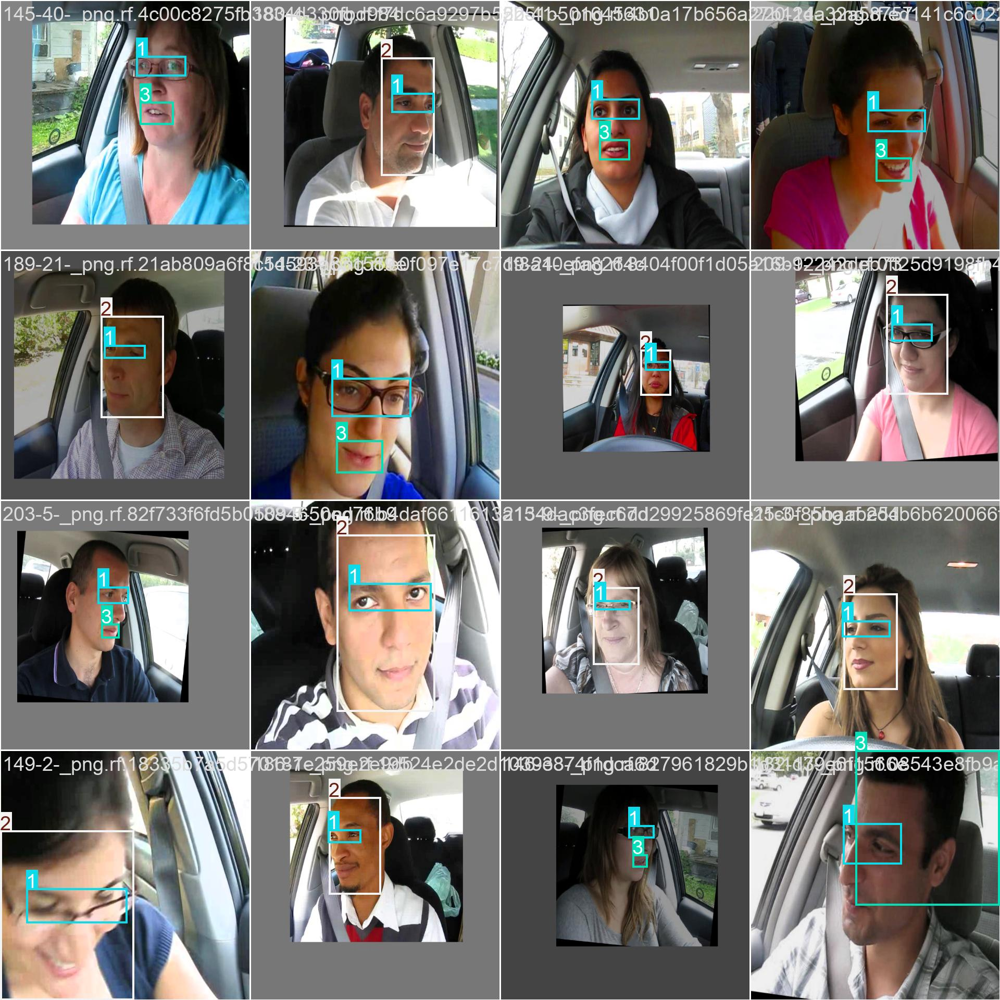

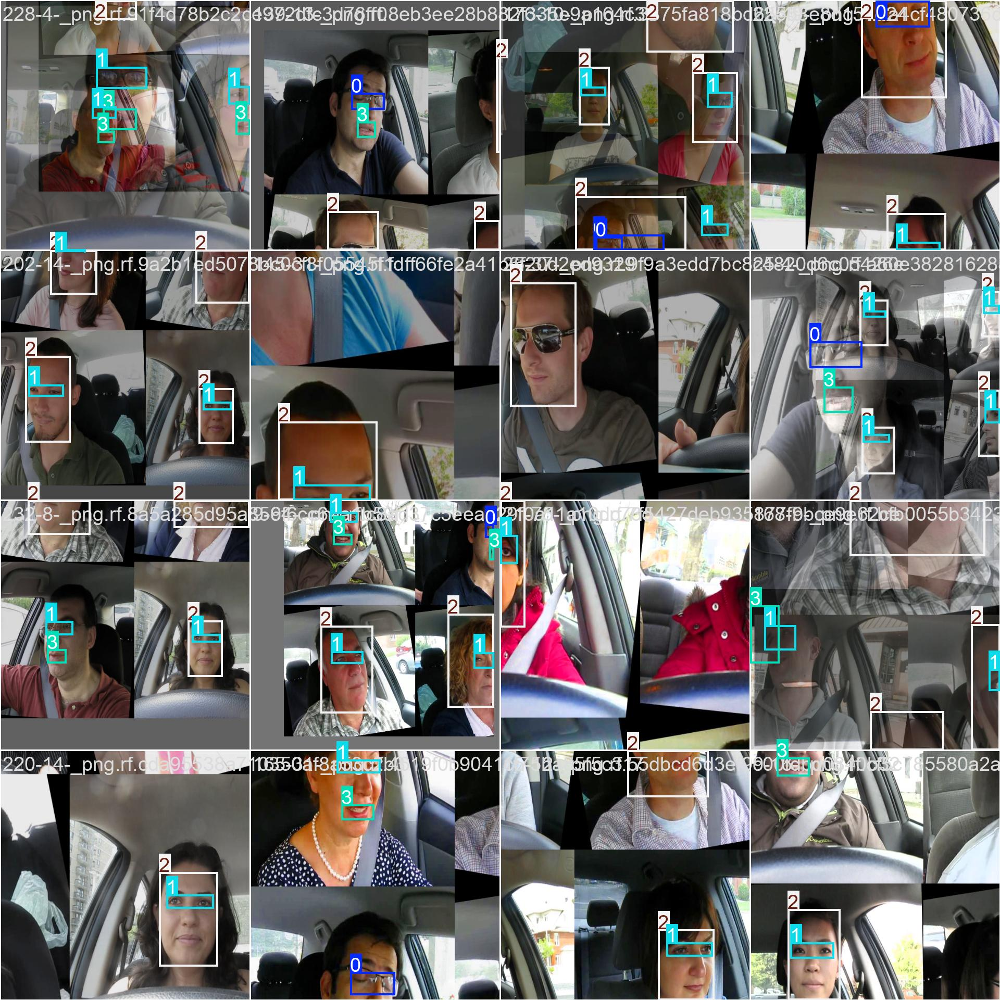

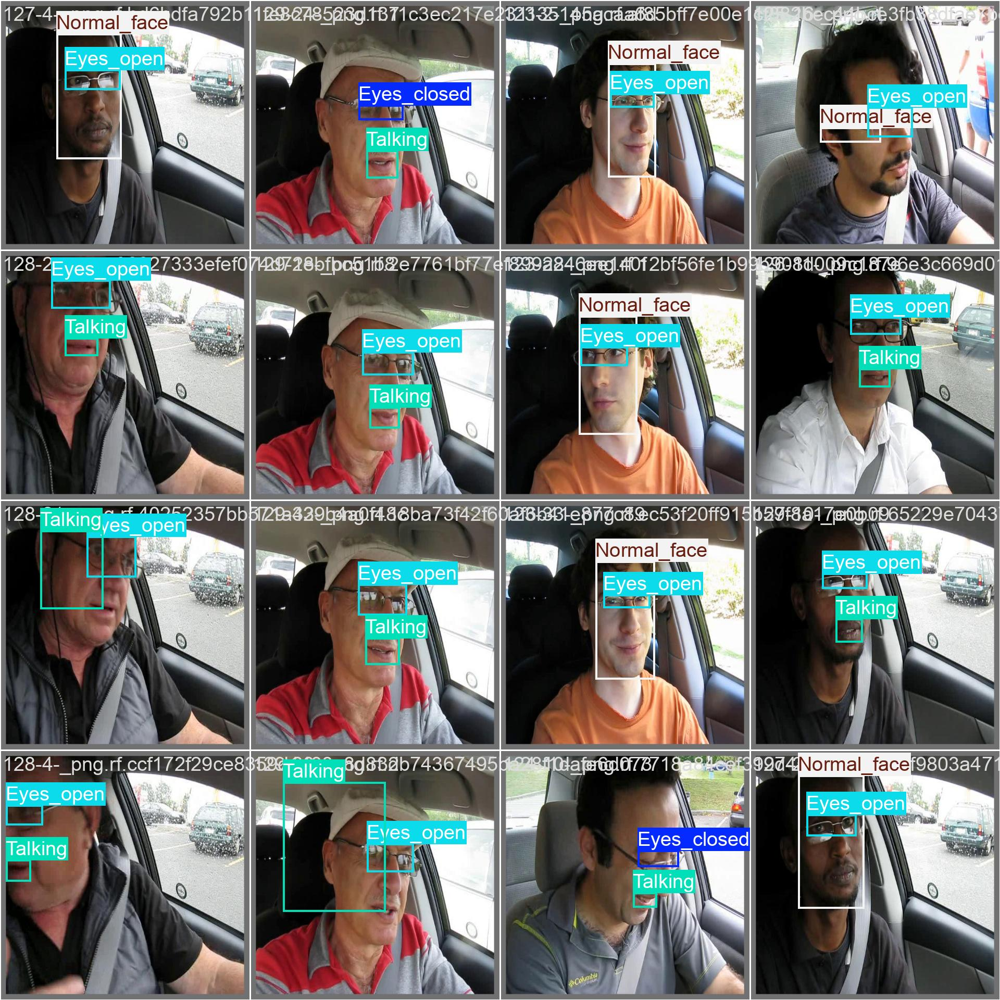

...

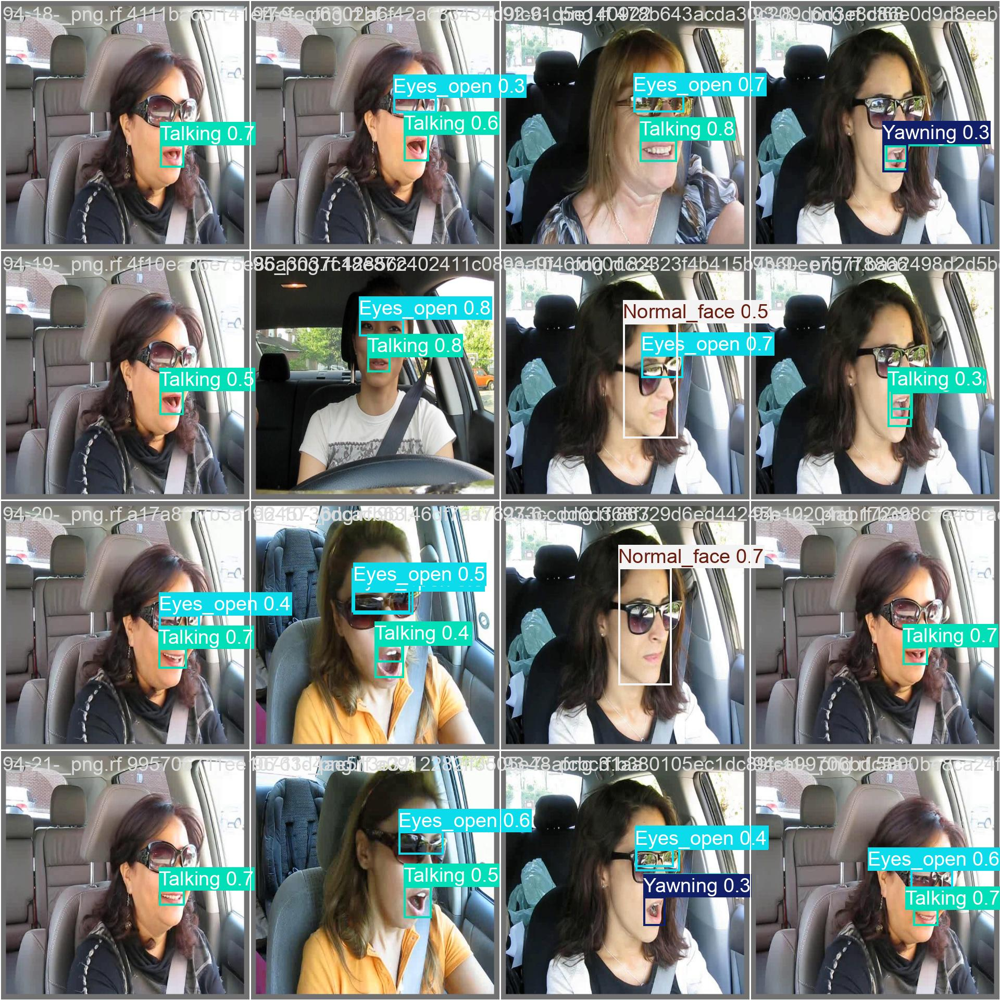

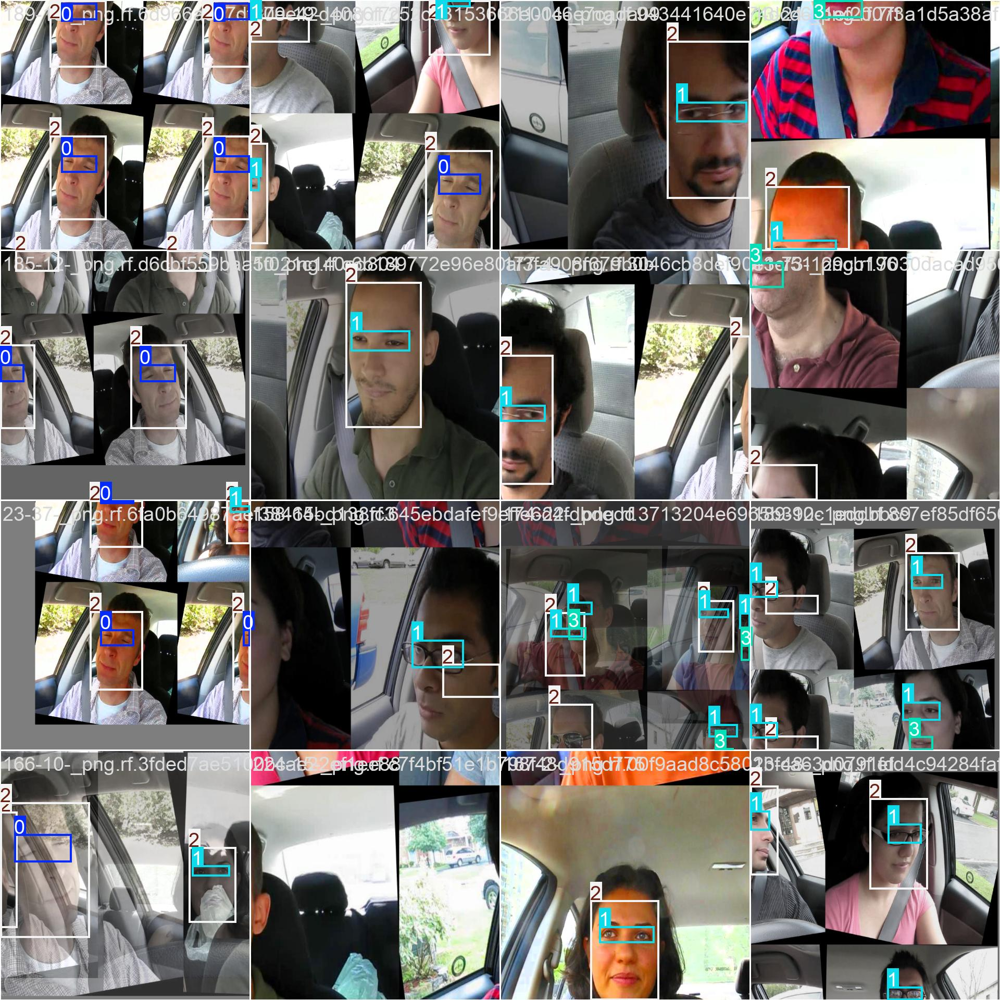

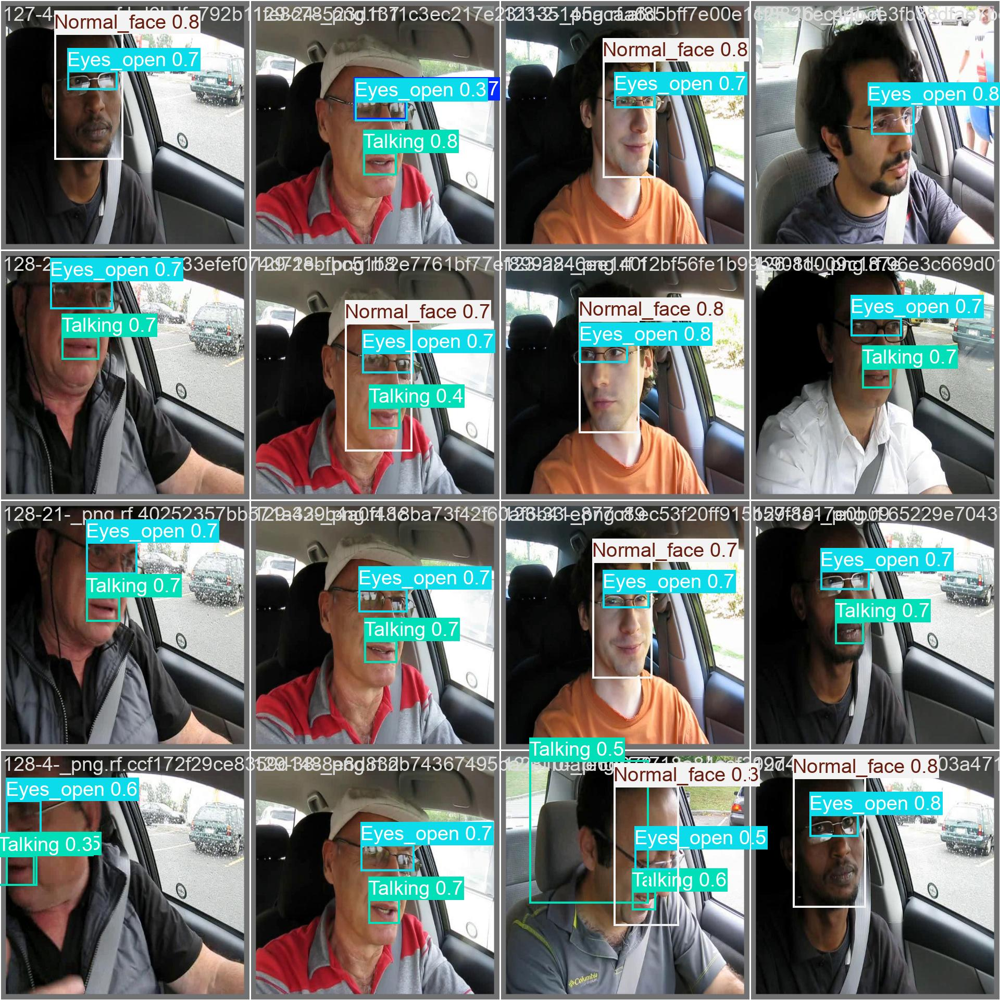

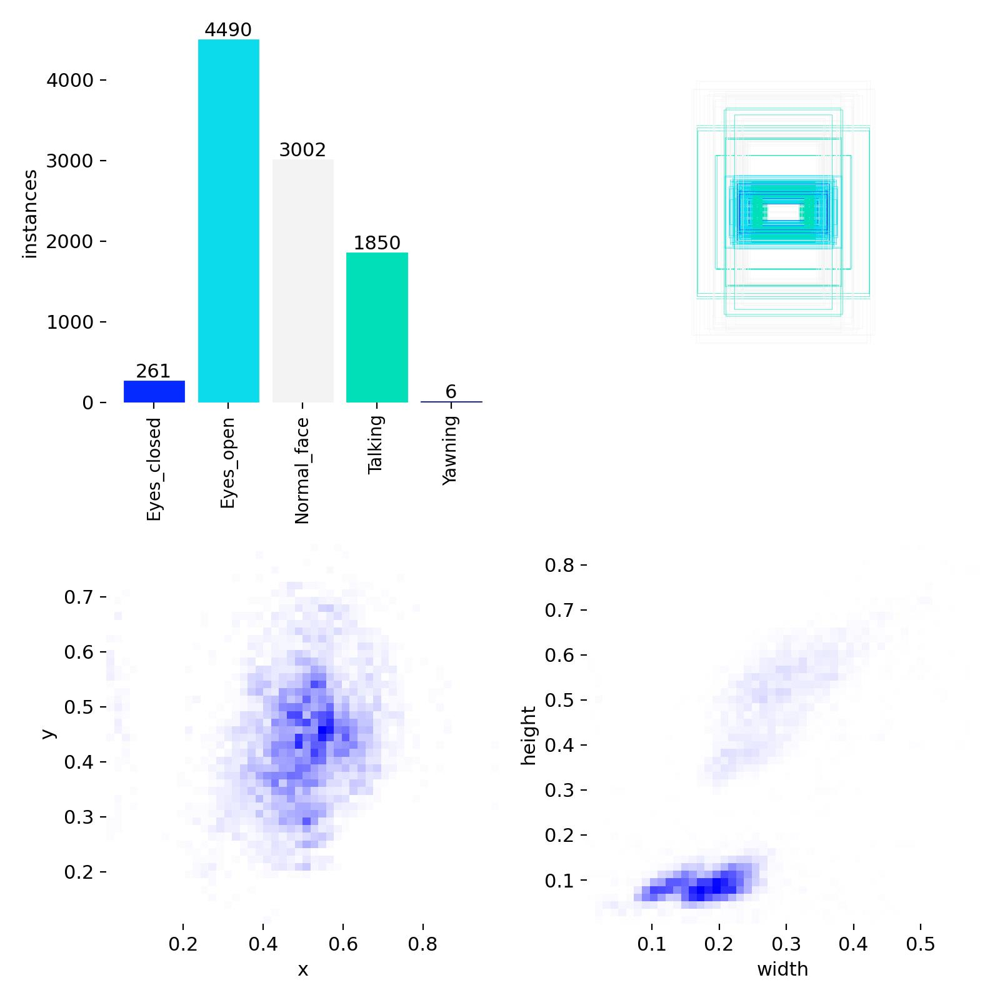

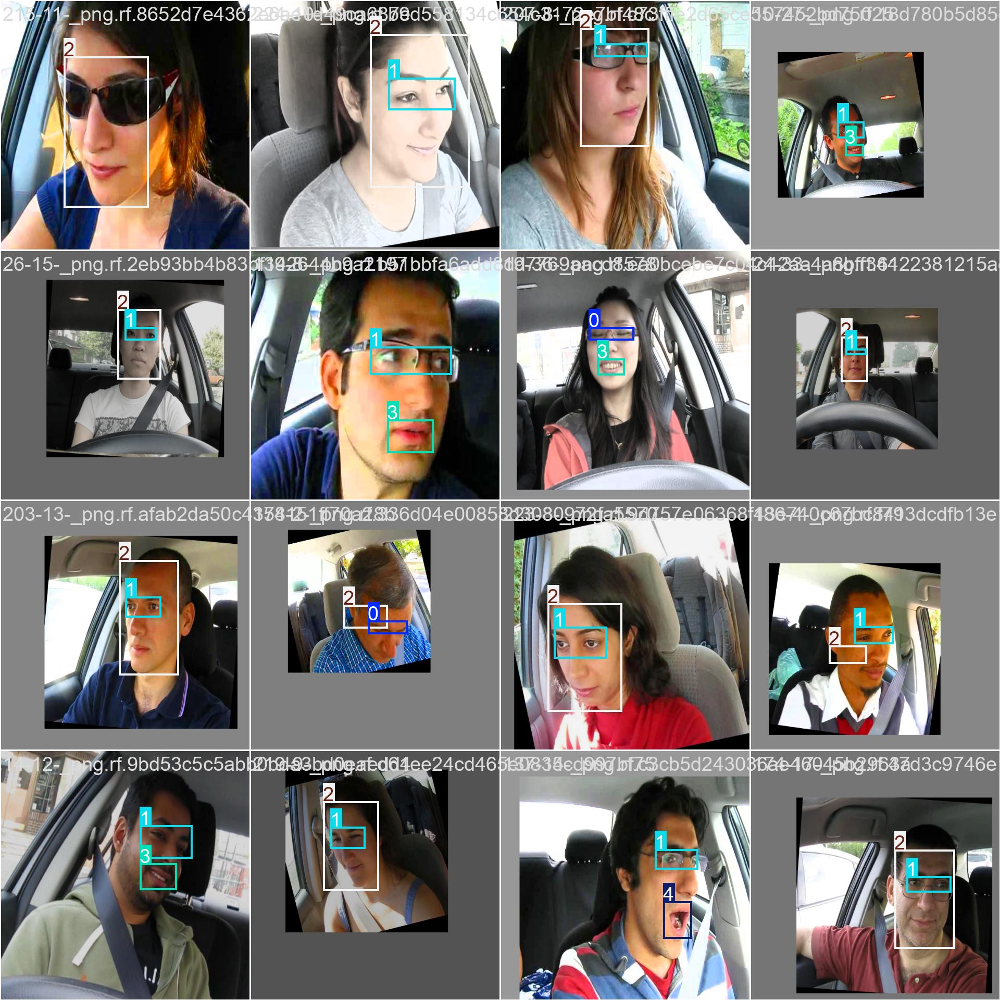

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/train4/*.jpg'):
  display(Image(filename=image_path, height=500))
  print("\n")

SAVE STUFF TO RESUME LATER

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Copy the entire training run to Drive
!cp -r /content/runs/detect/train4 /content/drive/MyDrive/yolo_training_backup

Mounted at /content/drive


In [2]:
# download the prev weigths
from google.colab import drive
drive.mount('/content/drive')
# Copy your files back to Colab
!cp -r /content/drive/MyDrive/yolo_training_backup /content/runs/detect

Mounted at /content/drive
cp: cannot create directory '/content/runs/detect': No such file or directory


In [ ]:
# to resume
# Just point to your last checkpoint and continue!
# !yolo train model=/content/drive/MyDrive/yolo_training_backup/weights/last.pt data=/content/Driver-drowsiness-15/data.yaml epochs=100 resume=True

<h1>Download enhanced dataset</h1>
<h3> added another dataset</h3>

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="zlt2fBb9LtooqmQXyeky")
project = rf.workspace("rawans-workspace-ktqx2").project("merged-driver-drowsiness-lp8va")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 83.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 117.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Merged-Driver-Drowsiness-1 in yolov11:: 100%|██████████| 7930/7930 [00:00<00:00, 8404.78it/s]


In [2]:
!ls -la "/content/Merged-Driver-Drowsiness-1"

total 36
drwxr-xr-x 5 root root 4096 Nov 18 10:05 .
drwxr-xr-x 1 root root 4096 Nov 18 10:05 ..
-rw-r--r-- 1 root root  418 Nov 18 10:05 data.yaml
-rw-r--r-- 1 root root  181 Nov 18 10:05 README.dataset.txt
-rw-r--r-- 1 root root  914 Nov 18 10:05 README.roboflow.txt
drwxr-xr-x 4 root root 4096 Nov 18 10:05 test
drwxr-xr-x 4 root root 4096 Nov 18 10:05 train
drwxr-xr-x 4 root root 4096 Nov 18 10:05 valid


In [7]:
# Check how many yawning examples you actually have
import os
labels_path = '/content/Merged-Driver-Drowsiness-1/train/labels'
yawning_count = 0
yarwning_count = 0

for label_file in os.listdir(labels_path):
    with open(os.path.join(labels_path, label_file), 'r') as f:
        for line in f:
            if line.startswith('4'):  # Yawning is class 4
                yawning_count += 1
            if line.startswith('7'):  # Yarwning is class 7
                yarwning_count += 1


print(f"Yawning training examples: {yawning_count}")
print(f"Yarwning training examples: {yarwning_count}")

Yawning training examples: 2
Yarwning training examples: 28


In [8]:
# merging the 2 classes

import os

def merge_yawning_classes(dataset_path):
    """Merge yarwning (class 7) into yawning (class 4)"""
    for split in ['train', 'valid', 'test']:
        labels_dir = os.path.join(dataset_path, split, 'labels')

        for label_file in os.listdir(labels_dir):
            file_path = os.path.join(labels_dir, label_file)
            new_lines = []

            with open(file_path, 'r') as f:
                for line in f:
                    if line.startswith('7'):  # Yarwning -> change to 4 (Yawning)
                        new_line = '4' + line[1:]  # Replace class ID
                        new_lines.append(new_line)
                    else:
                        new_lines.append(line)

            # Write back
            with open(file_path, 'w') as f:
                f.writelines(new_lines)

    print("Merged yarwning into yawning!")

# Run the merge
merge_yawning_classes('/content/Merged-Driver-Drowsiness-1')

# update yaml w new classes
# nc: 7  # ↓ from 8 to 7 (removed yarwning)
# names: ['Eyes_closed', 'Eyes_open', 'Normal_face', 'Talking', 'Yawning', 'dropping eye lids', 'dropping face']  # removed yarwning

Merged yarwning into yawning!


In [10]:
# Load dataset configuration
dataset_YAML_path = "/content/Merged-Driver-Drowsiness-1/data.yaml"

# Check dataset information
print(open(dataset_YAML_path).read())

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 7
names: ['Eyes_closed', 'Eyes_open', 'Normal_face', 'Talking', 'Yawning', 'dropping eye lids', 'dropping face']

roboflow:
  workspace: rawans-workspace-ktqx2
  project: merged-driver-drowsiness-lp8va
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/rawans-workspace-ktqx2/merged-driver-drowsiness-lp8va/dataset/1


<h1>Training on new dataset

In [11]:
i !yolo train model=/content/drive/MyDrive/yolo_training_backup/weights/best.pt data=/content/Merged-Driver-Drowsiness-1/data.yaml epochs=20 imgsz=640 batch=16

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Merged-Driver-Drowsiness-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/yolo_training_backup/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, ov

<h3> Train and use image augumentation, to fix bad yawning and closed eyes

In [3]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')
results = model.train(
    data='/content/Merged-Driver-Drowsiness-1/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    cls=3.0,
    augment=True,
    fliplr=0.5,
    mixup=0.2,
    copy_paste=0.3,
    lr0=0.001,
    patience=30
)

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=3.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Merged-Driver-Drowsiness-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=/content/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True,

<h3>Even more training to fix tilted head and dopping eyelids

In [4]:
model = YOLO('/content/runs/detect/train2/weights/best.pt')

model.train(
    data='/content/Merged-Driver-Drowsiness-1/data.yaml',
    epochs=50,
    imgsz=640,
    batch=16,

    # HEAVY augmentation for head rotations and yawning
    augment=True,
    degrees=45.0,        # ↑↑↑ Increased from 0.0 to 45° - CRITICAL for tilted heads
    translate=0.3,       # ↑↑↑ More translation
    scale=0.7,           # ↑↑↑ More scaling variation
    shear=25.0,          # ↑↑↑ Increased from 0.2 to 25° - simulates head tilts
    perspective=0.001,   # ↑↑↑ Increased perspective for 3D effects

    # Focus on rare classes
    cls=4.0,             # ↑↑↑ Even more class imbalance focus
    copy_paste=0.4,      # ↑↑↑ More yawning examples
    mixup=0.3,           # ↑↑↑ More blending

    # Training parameters
    lr0=0.0005,          # Lower learning rate for fine-tuning
    patience=40,

    verbose=True
)

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=4.0, compile=False, conf=None, copy_paste=0.4, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Merged-Driver-Drowsiness-1/data.yaml, degrees=45.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.3, mode=train, model=/content/runs/detect/train2/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x792c2c0d09e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

<h3>Nevermind that backfired.. lets go again but gentler

In [ ]:
from ultralytics import YOLO

# Go back to the model that worked best (train2)
model = YOLO('/content/runs/detect/train2/weights/best.pt')

model.train(
    data='/content/Merged-Driver-Drowsiness-1/data.yaml',
    epochs=30,  # Shorter training to avoid over-augmentation

    # GENTLE augmentation for real-world variations
    augment=True,
    degrees=15.0,        # ↓↓↓ Reduced from 45° to 15° - realistic head turns
    translate=0.1,       # ↓↓↓ Reduced translation
    scale=0.5,           # Normal scaling
    shear=5.0,           # ↓↓↓ Reduced from 25° to 5° - subtle head tilts
    perspective=0.0005,  # ↓↓↓ Reduced perspective

    # Focus on stability
    cls=3.0,             # Balanced class focus
    copy_paste=0.2,      # ↓↓↓ Reduced copy-paste
    mixup=0.1,           # ↓↓↓ Reduced mixup

    # Conservative training
    lr0=0.0001,          # ↓↓↓ Very low learning rate
    patience=20,

    verbose=True
)

Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=3.0, compile=False, conf=None, copy_paste=0.2, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Merged-Driver-Drowsiness-1/data.yaml, degrees=15.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=/content/runs/detect/train2/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr